In [1]:
import os
import sys
import numpy as np
import matplotlib.pyplot as plt
#plt.rcParams['figure.figsize']=(6,6)
#plt.rcParams['font.weight']='bold'
#plt.rcParams['axes.labelweight']='bold'
#plt.rcParams['lines.linewidth']=1.5
#plt.rcParams['lines.markeredgewidth']=2
%matplotlib inline
%config InlineBackend.figure_format = "retina"

sys.path.append('/Applications/OpenFUSIONToolkit/python')
from OpenFUSIONToolkit.TokaMaker import TokaMaker
from OpenFUSIONToolkit.TokaMaker.meshing import load_gs_mesh
from OpenFUSIONToolkit.TokaMaker.util import create_isoflux, read_eqdsk

from omfit_classes.omfit_eqdsk import boundaryShape

In [2]:
mygs = TokaMaker()
mesh_pts,mesh_lc,mesh_reg,coil_dict,cond_dict = load_gs_mesh('nextstep_mesh_0809_noplate.h5')
mygs.setup_mesh(mesh_pts, mesh_lc, mesh_reg)
mygs.setup_regions(cond_dict=cond_dict,coil_dict=coil_dict)
mygs.setup(order=2,F0=1*3)

coil_reg_mat = np.zeros((mygs.ncoils+1,mygs.ncoils+1), dtype=np.float64)
targets = np.zeros(mygs.ncoils+1)
coil_weights = 0.5*np.ones(mygs.ncoils+1)

#Constrain CS current
coil_reg_mat[0,0] = 1
coil_reg_mat[1,1] = 1
coil_reg_mat[1,0] = -1
coil_reg_mat[2,2] = 1
coil_reg_mat[2,1] = -1

targets[0] = -3E6

coil_weights[:3] = 5

#Enforce up/down symmetry in PF coils
coil_reg_mat[3,3] = 1
coil_reg_mat[3,7] = -1
coil_reg_mat[4,4] = 1
coil_reg_mat[4,8] = -1
coil_reg_mat[5,5] = 1
coil_reg_mat[5,9] = -1
coil_reg_mat[6,6] = 1
coil_reg_mat[6,10] = -1

mygs.set_coil_reg(coil_reg_mat, targets, coil_weights)

#Set upper bound on coil currents
coil_bounds = np.zeros((mygs.ncoils+1,2), dtype=np.float64)
coil_bounds[:,0] = -1.E11; coil_bounds[:,1] = 1.E11

#Set upper bounds on divertor coils
#coil_bounds[-5:-1, 0] = -122448.979592
#coil_bounds[-5:-1, 1] = 122448.979592
coil_bounds[-3:-1, 0] = 0
coil_bounds[-3:-1, 1] = 0

mygs.set_coil_bounds(coil_bounds)

# Define shape of P' anf FF' profiles
n_sample = 40
psi_sample = np.linspace(0.0,1.0,n_sample)
# Set F*F' profile
alpha = 2
gamma = 1.25
ffp_prof = {
    'type': 'linterp',
    'x': psi_sample,
    'y': np.power(1.0-np.power(psi_sample,alpha),gamma)
}
ffp_prof['y'] /= ffp_prof['y'][0] # Normalize profile (not required but convienient)
# Set P' profile
alpha = 2
gamma = 1.25
pp_prof = {
    'type': 'linterp',
    'x': psi_sample,
    'y': np.power(1.0-np.power(psi_sample,alpha),gamma)
}
pp_prof['y'] /= pp_prof['y'][0] # Normalize profile (not required but convienient)

mygs.set_profiles(ffp_prof=ffp_prof,pp_prof=pp_prof)

# set global targets
Ip_target = 0.75E6
mygs.set_targets(Ip = Ip_target, Ip_ratio=1.0)

#----------------------------------------------
Open FUSION Toolkit Initialized
Development branch:   main
Revision id:          aba6d8f
Parallelization Info:
  Not compiled with MPI
  # of OpenMP threads =    2
Fortran input file    = oftpyin                                                                         
XML input file        = none                                                                            
Integer Precisions    =    4   8
Float Precisions      =    4   8  16
Complex Precisions    =    4   8
LA backend            = native
#----------------------------------------------


**** Generating surface grid level  1
  Generating boundary domain linkage
  Mesh statistics:
    Area         =  4.914E+00
    # of points  =    5539
    # of edges   =   16498
    # of cells   =   10960
    # of boundary points =     116
    # of boundary edges  =     116
    # of boundary cells  =     116
  Resolution statistics:
    hmin =  3.000E-03
    hrms =  3.420E-02
    hmax =  1.0

Starting non-linear GS solver
     1  9.3763E+00  4.2988E+00  2.4131E-02  1.0473E+00  8.2909E-05 -0.0000E+00
     2  7.4173E+00  3.4593E+00  4.6108E-03  1.0461E+00  4.8210E-05 -0.0000E+00
     3  6.9705E+00  3.2705E+00  1.0781E-03  1.0451E+00  3.0587E-05 -0.0000E+00
     4  6.8206E+00  3.2073E+00  8.9983E-04  1.0445E+00  2.2271E-05 -0.0000E+00
     5  6.7687E+00  3.1856E+00  5.1839E-04  1.0442E+00  1.8318E-05 -0.0000E+00
     6  6.7515E+00  3.1784E+00  2.5103E-04  1.0441E+00  1.6408E-05 -0.0000E+00
     7  6.7462E+00  3.1762E+00  1.1022E-04  1.0441E+00  1.5495E-05 -0.0000E+00
     8  6.7448E+00  3.1756E+00  4.5127E-05  1.0440E+00  1.5061E-05 -0.0000E+00
     9  6.7445E+00  3.1755E+00  1.7423E-05  1.0440E+00  1.4851E-05 -0.0000E+00
    10  6.7444E+00  3.1755E+00  6.3597E-06  1.0440E+00  1.4748E-05 -0.0000E+00
    11  6.7445E+00  3.1755E+00  2.1856E-06  1.0440E+00  1.4696E-05 -0.0000E+00
    12  6.7445E+00  3.1755E+00  6.9945E-07  1.0440E+00  1.4670E-05 -0.0000E+00
 Timing:  0.2042039996

Starting non-linear GS solver
     1  7.2561E+00  3.4361E+00  2.1993E-02  1.0354E+00 -1.4322E-04 -0.0000E+00
     2  6.1118E+00  2.9122E+00  3.6433E-03  1.0360E+00 -1.1157E-04 -0.0000E+00
     3  5.8317E+00  2.7858E+00  9.7197E-04  1.0359E+00 -9.3566E-05 -0.0000E+00
     4  5.7291E+00  2.7389E+00  8.1860E-04  1.0358E+00 -8.3142E-05 -0.0000E+00
     5  5.6894E+00  2.7204E+00  4.8488E-04  1.0358E+00 -7.7377E-05 -0.0000E+00
     6  5.6742E+00  2.7131E+00  2.4922E-04  1.0357E+00 -7.4333E-05 -0.0000E+00
     7  5.6685E+00  2.7102E+00  1.1945E-04  1.0357E+00 -7.2753E-05 -0.0000E+00
     8  5.6665E+00  2.7091E+00  5.4857E-05  1.0357E+00 -7.1942E-05 -0.0000E+00
     9  5.6657E+00  2.7087E+00  2.4453E-05  1.0357E+00 -7.1531E-05 -0.0000E+00
    10  5.6655E+00  2.7085E+00  1.0655E-05  1.0357E+00 -7.1323E-05 -0.0000E+00
    11  5.6655E+00  2.7085E+00  4.5612E-06  1.0357E+00 -7.1219E-05 -0.0000E+00
    12  5.6654E+00  2.7085E+00  1.9249E-06  1.0357E+00 -7.1167E-05 -0.0000E+00
    13  5.6654E+00  2.

Starting non-linear GS solver
     1  6.6614E+00  3.1908E+00  2.1564E-02  1.0371E+00 -1.3650E-05 -0.0000E+00
     2  6.3987E+00  3.0728E+00  3.5903E-03  1.0375E+00 -1.0854E-05 -0.0000E+00
     3  6.3206E+00  3.0392E+00  7.5481E-04  1.0375E+00 -9.0159E-06 -0.0000E+00
     4  6.2910E+00  3.0267E+00  2.2114E-04  1.0375E+00 -7.8057E-06 -0.0000E+00
     5  6.2793E+00  3.0218E+00  9.8019E-05  1.0374E+00 -7.0542E-06 -0.0000E+00
     6  6.2747E+00  3.0199E+00  4.9397E-05  1.0374E+00 -6.6126E-06 -0.0000E+00
     7  6.2728E+00  3.0191E+00  2.4461E-05  1.0374E+00 -6.3676E-06 -0.0000E+00
     8  6.2721E+00  3.0189E+00  1.1649E-05  1.0374E+00 -6.2358E-06 -0.0000E+00
     9  6.2718E+00  3.0187E+00  5.3574E-06  1.0374E+00 -6.1662E-06 -0.0000E+00
    10  6.2717E+00  3.0187E+00  2.3961E-06  1.0374E+00 -6.1301E-06 -0.0000E+00
    11  6.2717E+00  3.0187E+00  1.0484E-06  1.0374E+00 -6.1115E-06 -0.0000E+00
    12  6.2716E+00  3.0187E+00  4.5084E-07  1.0374E+00 -6.1021E-06 -0.0000E+00
 Timing:   4.696992999

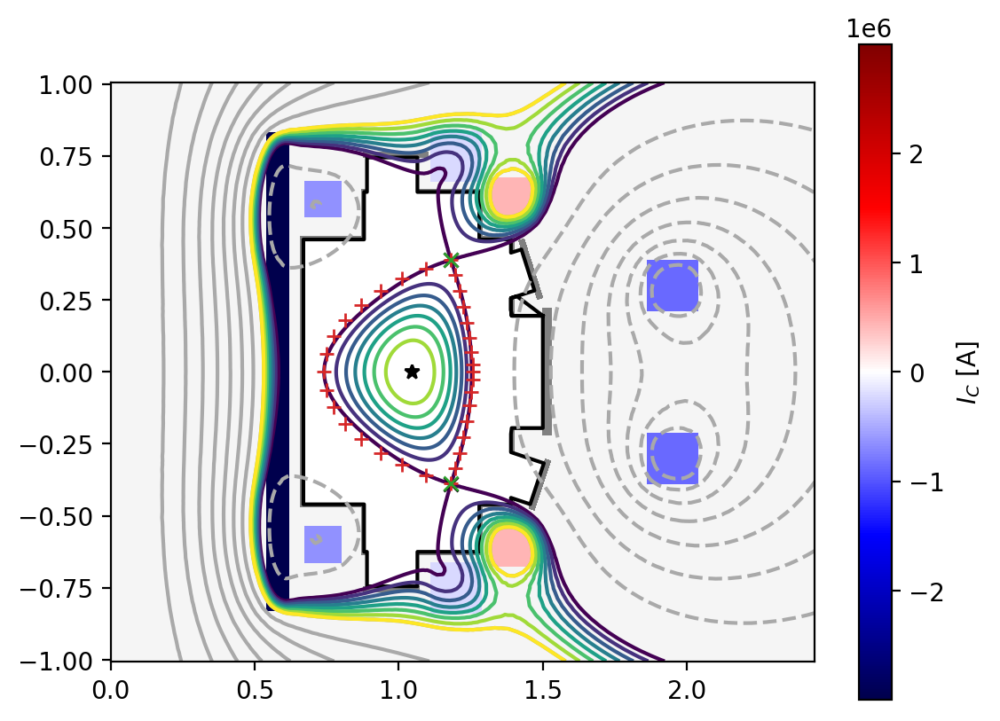

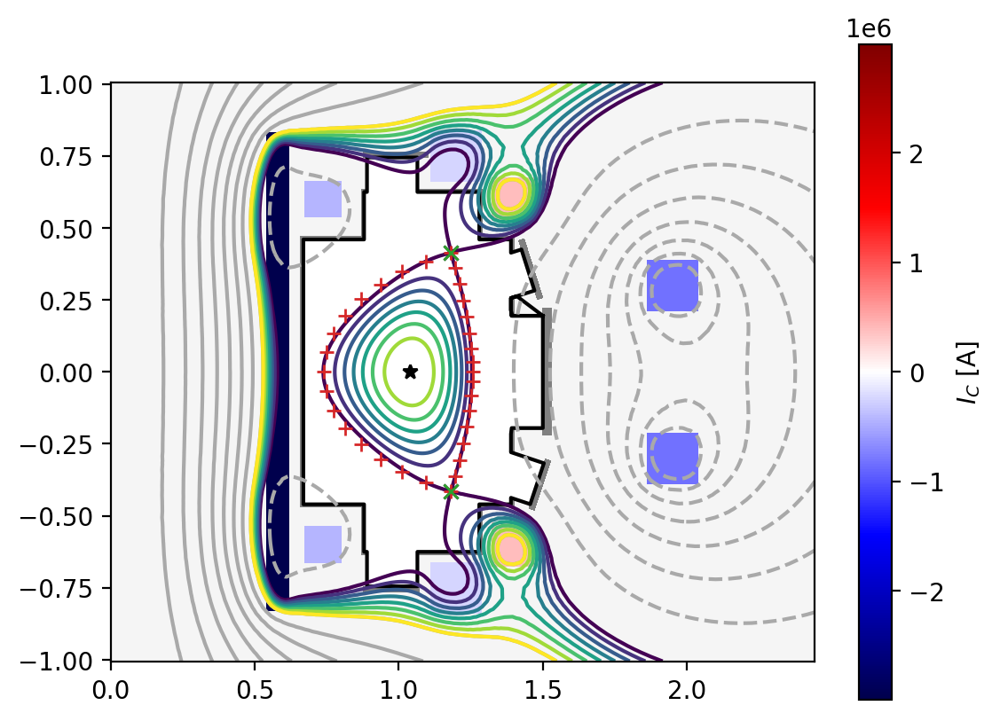

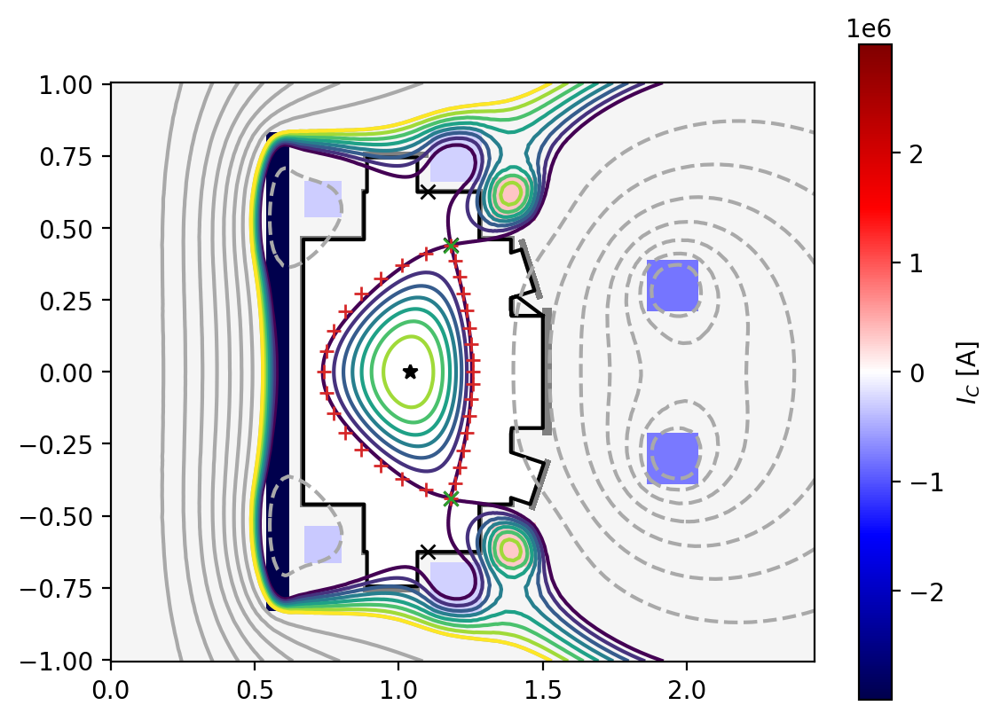

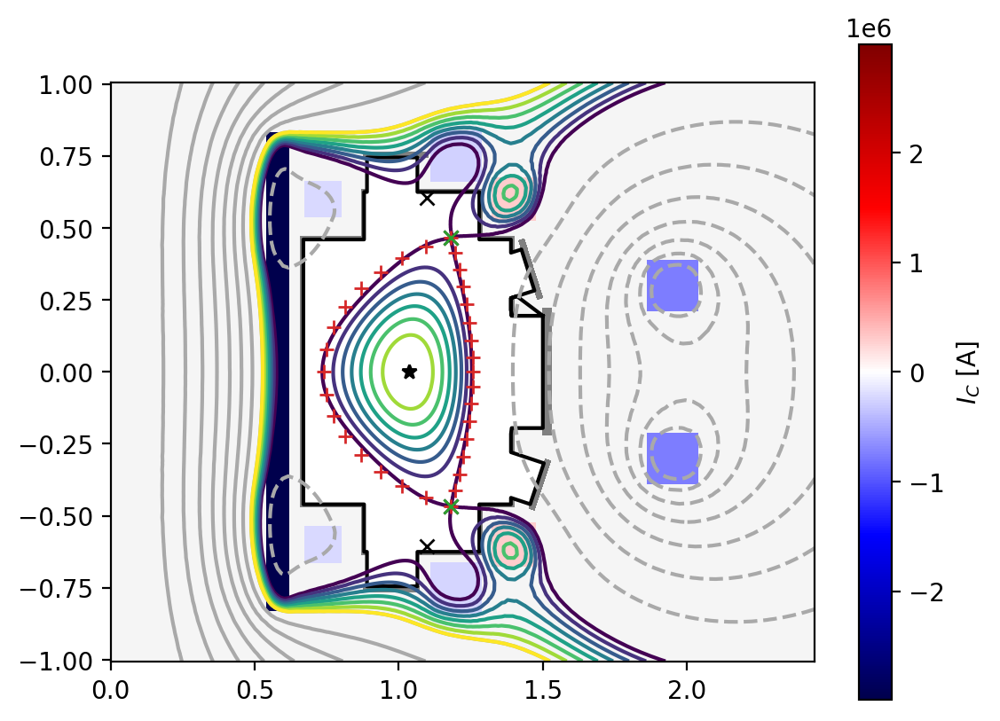

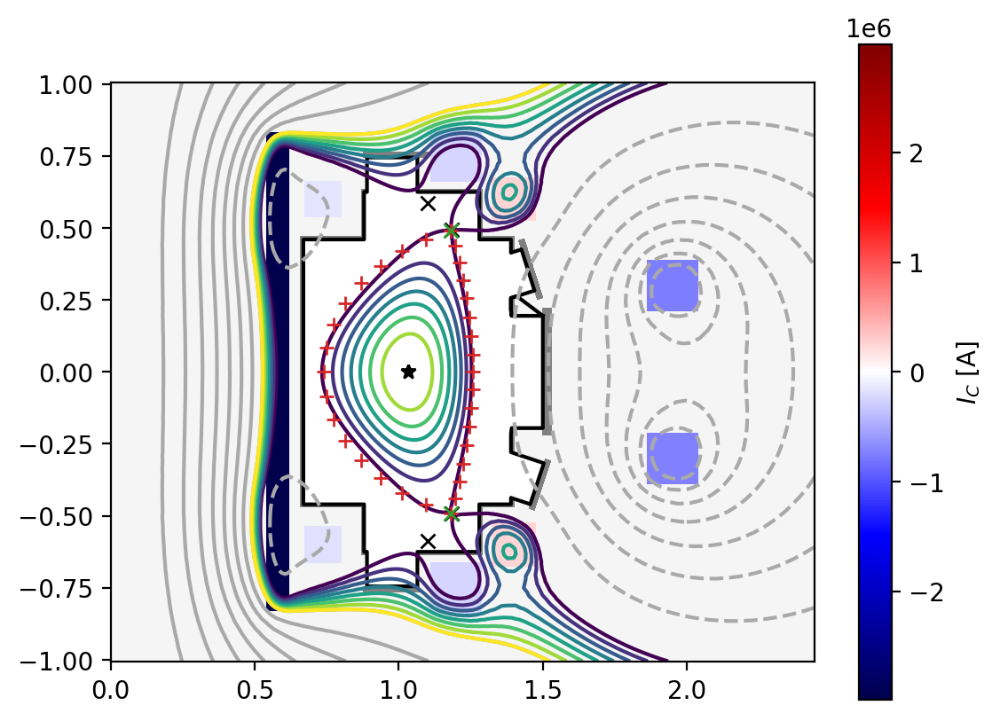

...

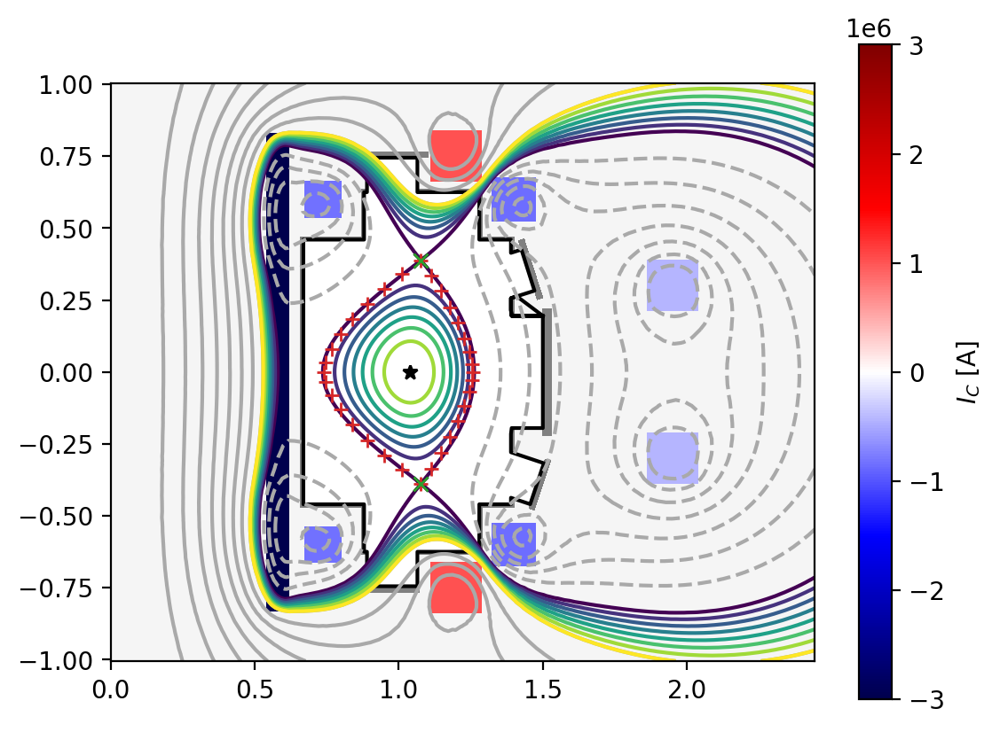

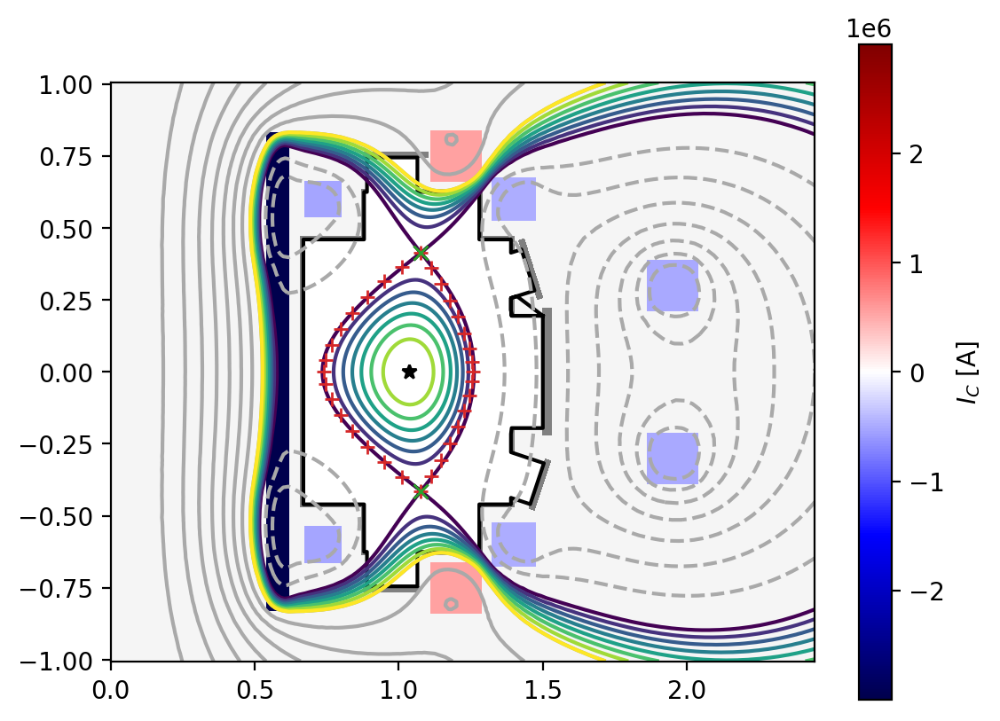

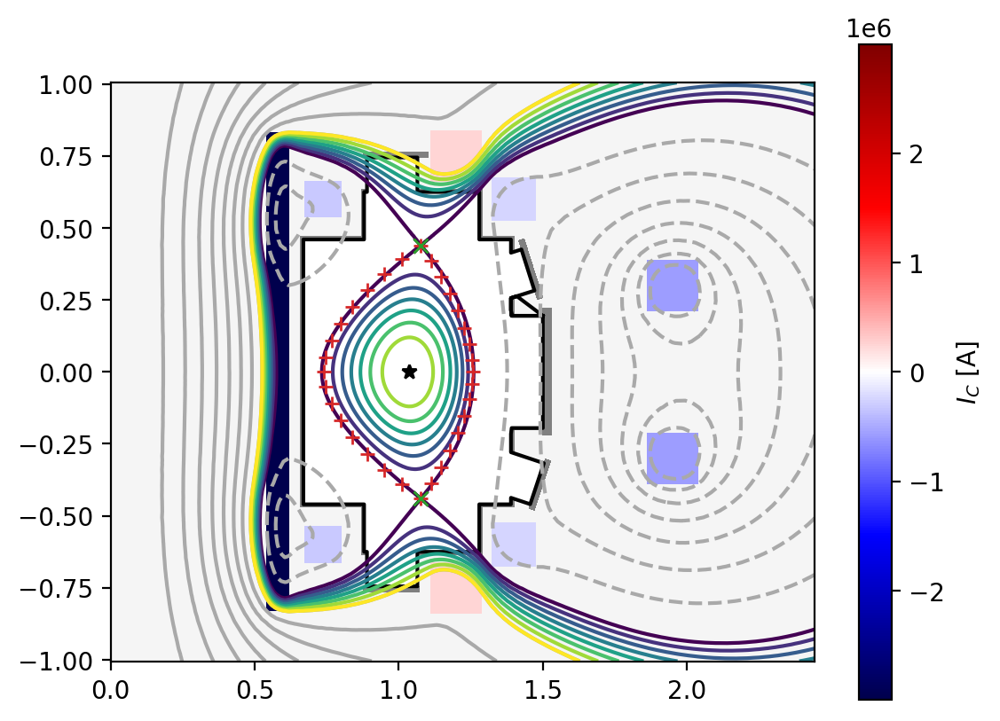

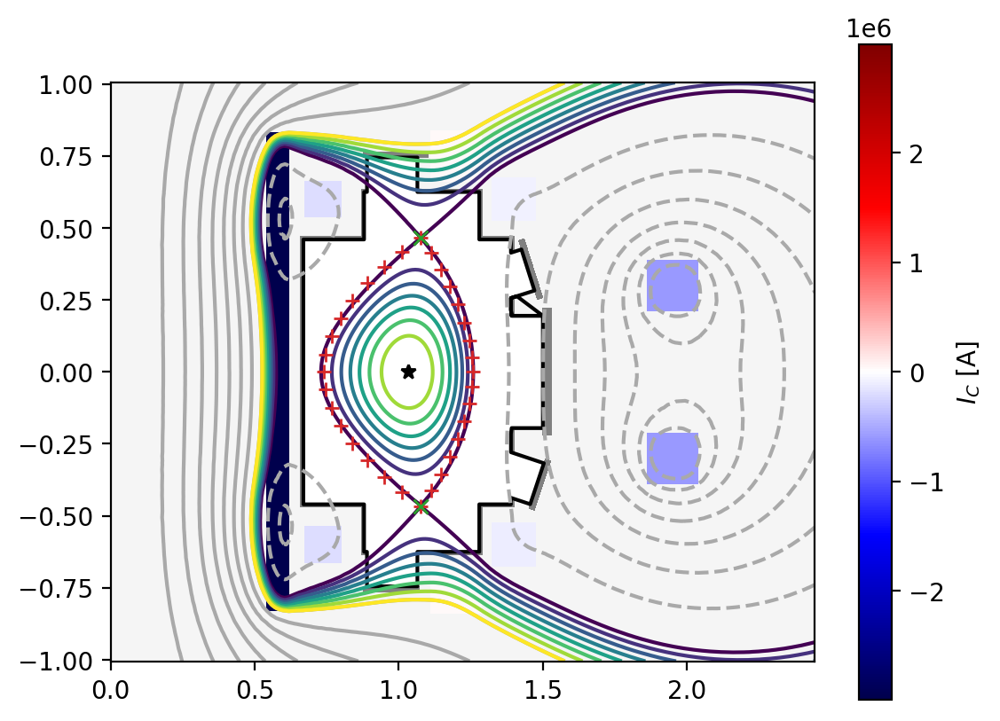

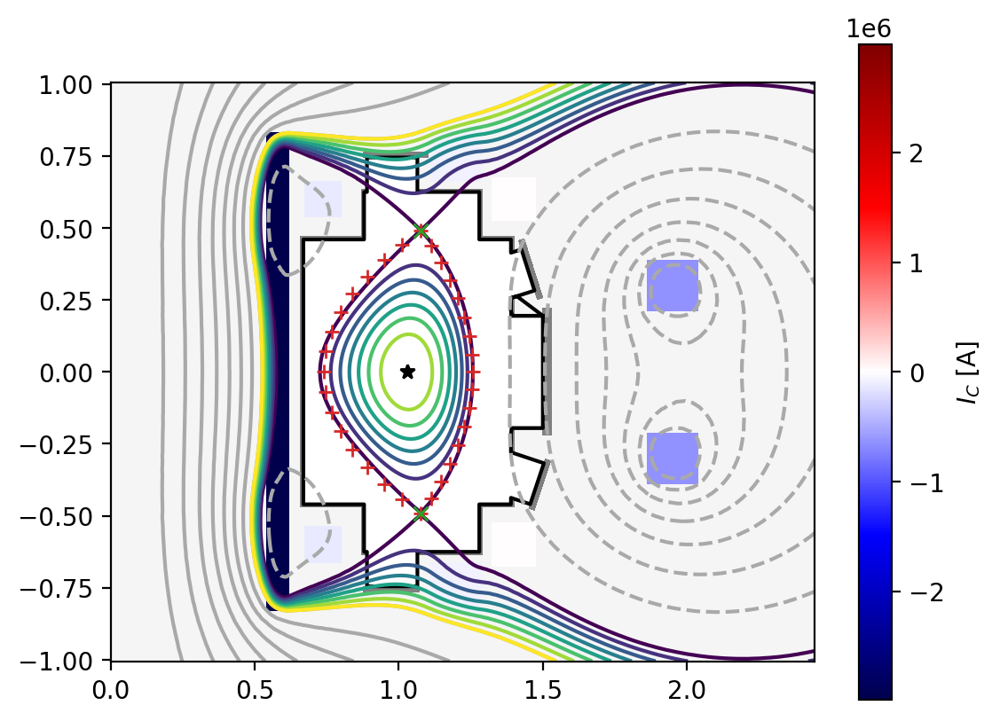

In [3]:
ds = np.linspace(-0.7, -.3, 5)
es = np.linspace(1.5, 1.9, 5)
#ds = [ds[0]]
#es = [es[0]]

deltas = []
kappas = []
currents = []
q_95s = []
gammas = []
taus = []
for d in ds:
    for e in es:
        r, z, zeff = boundaryShape(kapu = e, kapl = e, delu = d, dell = d, zetail = 0, zetaiu = 0, zetaou = 0, zetaol = 0, a = 0.2588, eps = 0.2588/1, zoffset = 0, upnull = True, lonull = True, npts = 8)
        boundary = np.column_stack((r,z))
        boundary = np.nan_to_num(boundary)

        x_points = np.zeros((2,2))
        x_points[0,:] = boundary[np.argmin(boundary[:,1]),:]
        x_points[1,:] = boundary[np.argmax(boundary[:,1]),:]
        x_weights = 50*np.ones(2)
        mygs.set_saddles(x_points, x_weights)

        strike_ul = [1.06, 0.55]
        strike_ur = [1.255, 0.495]

        strike_ll = np.copy(strike_ul)
        strike_ll[1] = -strike_ul[1]
        strike_lr = np.copy(strike_ur)
        strike_lr[1] = -strike_ur[1]

        #boundary = np.vstack((boundary, strike_ul, strike_ll, strike_lr, strike_ur))
        isoflux_weights = 50*np.ones(len(boundary))
        #isoflux_weights[-4:] = 500

        mygs.set_isoflux(boundary, isoflux_weights)

        mygs.init_psi(0.68,0,0.2, 1.8,0.3)
        mygs.settings.maxits = 100
        mygs.update_settings()
        mygs.solve()

        stats = mygs.get_stats()
        deltas.append(np.min((stats['deltaU'], stats['deltaL'])))
        kappas.append(np.max((stats['kappaU'], stats['kappaL'])))
        q_95s.append(stats['q_95'])
        curr, map = mygs.get_coil_currents()
        currents.append(curr)

        eig_vals, eig_vecs = mygs.eig_td(-5.E4,10,True) 
        gammas.append(eig_vals[0,0])
        eig_wall, eigvec_wall = mygs.eig_wall()
        tau_w = 1/eig_wall[1][0]
        taus.append(tau_w)

        fig, ax = plt.subplots()
        mygs.plot_machine(fig,ax, coil_symmap = True, coil_colormap = 'seismic')
        mygs.plot_psi(fig,ax)
        mygs.plot_constraints(fig, ax)

## Max coil current density 

In [4]:
coil_currents = np.array(currents)

In [5]:
max = []
which = []
coil_dim = np.array([0.125,0.125, 0.175,0.175,0.15,0.15, 0.175, 0.175])
for i in range(len(deltas)):
    pf_curr = coil_currents[i][3:-2]/1E6
    dens = pf_curr/coil_dim**2
    max.append(np.max(np.abs(dens)))
    which.append(np.argmax(np.abs(np.abs(dens))))

In [31]:
print(which)
print(cap)
print(pf_curr)

[1, 1, 6, 6, 6, 1, 1, 1, 6, 6, 1, 1, 1, 6, 6, 0, 1, 1, 6, 6, 0, 1, 1, 6, 6]
61.65167383517892
[-0.12576027 -0.13341749 -0.08335119 -0.08211661  0.01485595  0.01282728
 -0.6345212  -0.63012132]


In [34]:
print(max)

[40.86319366728362, 28.157766676293125, 26.02403256457788, 25.03627382887903, 24.388537819813372, 55.15551471392927, 37.607201102653114, 25.77974764951705, 24.583000636829475, 24.15840908899867, 61.65167383517892, 41.28798007553788, 27.7817190273175, 23.39236847778232, 23.366347695609093, 60.40598728982378, 39.47795787215785, 25.859635974293344, 21.741336325421628, 22.19211169540459, 53.391002800681285, 33.402241230829716, 20.661257322823577, 19.724522710054465, 20.71905956806475]


In [32]:
cap = np.max(max)
q_95s = np.array(q_95s)

ip_coils = 0.75*cap/max
ip_q = 0.75* q_95s/2
print(ip_coils)
print(ip_q)

ip_max = np.min((ip_coils, ip_q), axis = 0)
print(ip_max)
#Can get 1 MA for high kappa shapes

[1.13155021 1.64213149 1.77677135 1.84687049 1.89592159 0.83833422
 1.22951866 1.79360776 1.88092398 1.9139818  0.75       1.11990839
 1.66435905 1.97665984 1.97886105 0.76546643 1.171255   1.78806675
 2.12676694 2.08356717 0.86604021 1.38430098 2.2379449  2.34422683
 2.23170145]
[0.7340657  0.81202024 0.8940191  0.98182332 1.07159757 0.71310911
 0.78556389 0.86224321 0.94071728 1.02095102 0.7043891  0.77615117
 0.84989826 0.92636673 1.00587795 0.69457938 0.76646786 0.84316893
 0.92272252 1.00300222 0.68891875 0.76002053 0.83694166 0.91918726
 1.00661829]
[0.7340657  0.81202024 0.8940191  0.98182332 1.07159757 0.71310911
 0.78556389 0.86224321 0.94071728 1.02095102 0.7043891  0.77615117
 0.84989826 0.92636673 1.00587795 0.69457938 0.76646786 0.84316893
 0.92272252 1.00300222 0.68891875 0.76002053 0.83694166 0.91918726
 1.00661829]


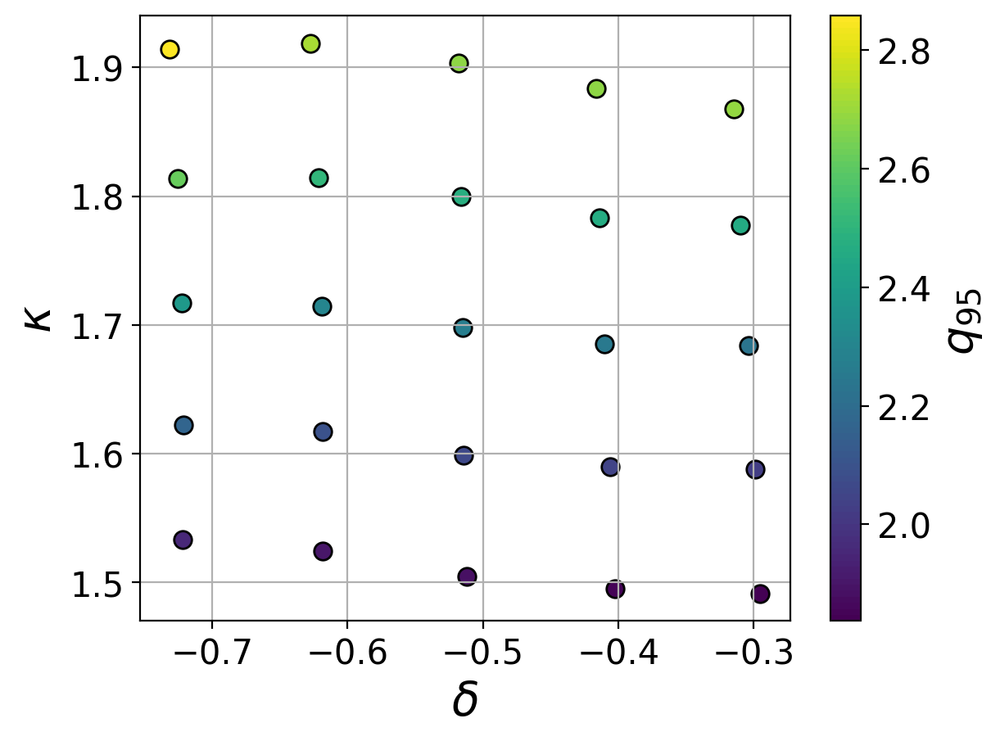

In [10]:
import matplotlib as mpl
norm = plt.Normalize(np.min(q_95s), np.max(q_95s))
cmap = mpl.cm.viridis(np.linspace(0,1,100))
cmap = mpl.colors.ListedColormap(cmap[:,:-1])
c = cmap(norm(q_95s))

for i in range(25):
    plt.scatter(deltas[i], kappas[i], color = c[i], edgecolors = 'k', s = 60)
plt.xlabel(r'$\delta$', size = 20)
plt.ylabel(r'$\kappa$', size = 20)
#plt.xlim([-0.7, -0.2])
#plt.ylim([1.4, 1.95])
plt.xticks(np.linspace(-0.7, -0.3, 5),size = 15)
plt.yticks(size = 15)
plt.grid()
sm = plt.cm.ScalarMappable(cmap=cmap, norm = norm)
cb = plt.colorbar(sm)
cb.set_label(label=r'$q_{95}$ ', size = 20)
cb.ax.tick_params(labelsize=15)

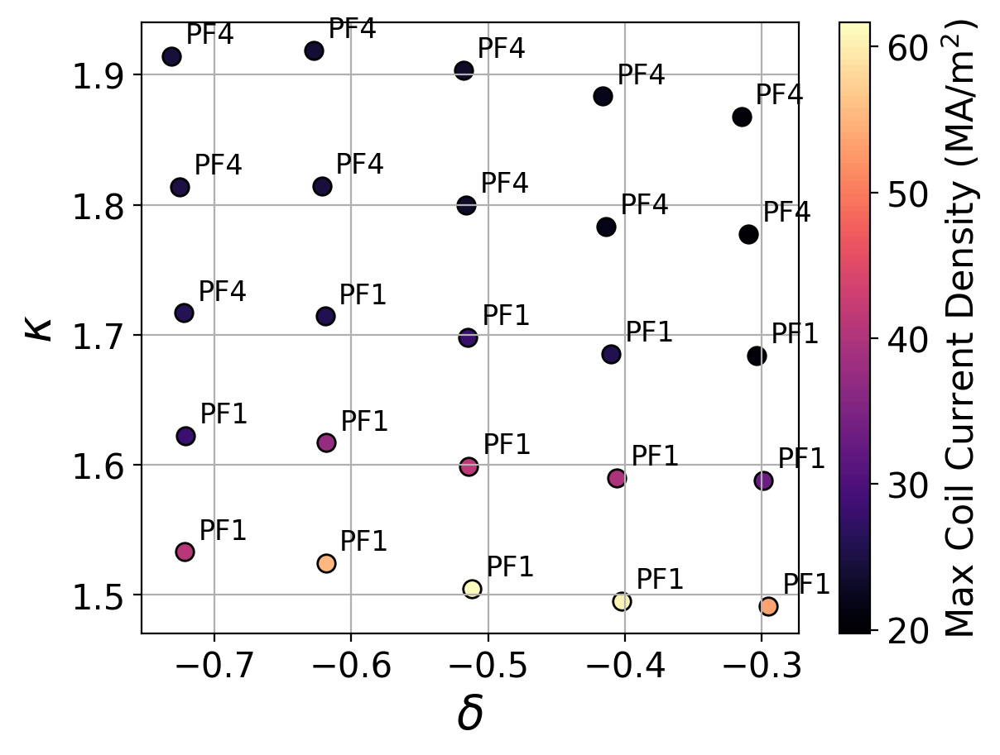

In [20]:
import matplotlib as mpl
norm = plt.Normalize(np.min(max), np.max(max))
cmap = mpl.cm.magma(np.linspace(0,1,100))
cmap = mpl.colors.ListedColormap(cmap[:,:-1])
c = cmap(norm(max))
names = ['PF1', 'PF1', 'PF2', 'PF2', 'PF3', 'PF3', 'PF4', 'PF4']
for i in range(25):
    plt.scatter(deltas[i], kappas[i], color = c[i], edgecolors = 'k', s = 60)
    plt.text(deltas[i]+0.01, kappas[i]+0.01, names[which[i]], fontsize = 12)
plt.xlabel(r'$\delta$', size = 20)
plt.ylabel(r'$\kappa$', size = 20)
#plt.xlim([-0.7, -0.2])
#plt.ylim([1.4, 1.95])
plt.xticks(np.linspace(-0.7, -0.3, 5),size = 15)
plt.yticks(size = 15)
plt.grid()
sm = plt.cm.ScalarMappable(cmap=cmap, norm = norm)
cb = plt.colorbar(sm)
cb.set_label(label= r'Max Coil Current Density (MA/$\mathrm{m}^2$)' , size = 16)
cb.ax.tick_params(labelsize=15)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24


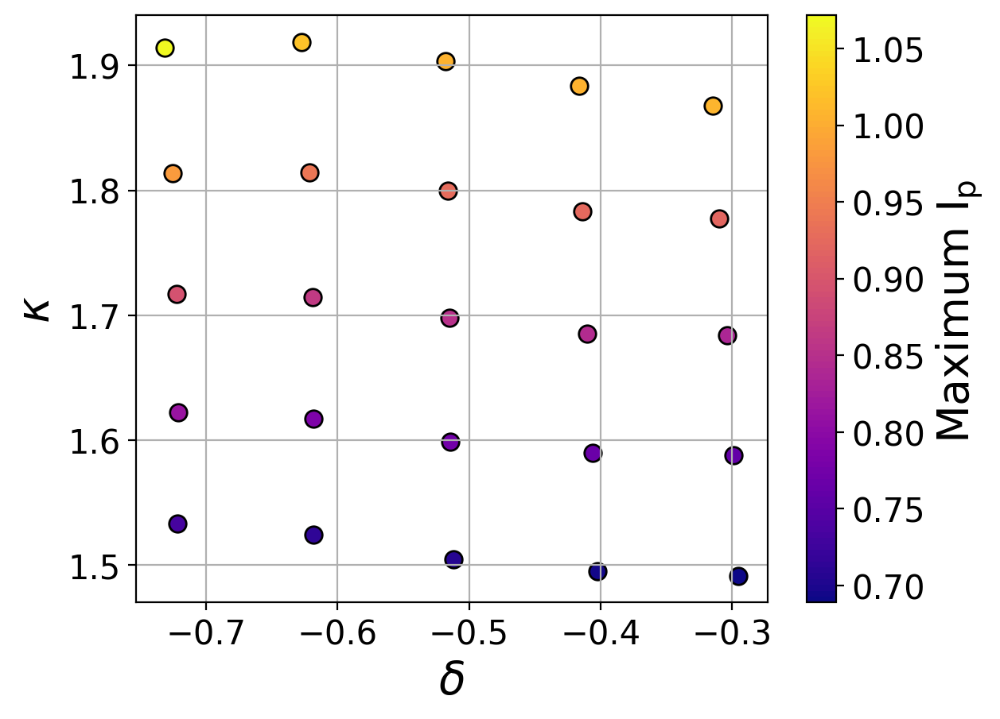

In [29]:
import matplotlib as mpl
norm = plt.Normalize(np.min(ip_max), np.max(ip_max))
cmap = mpl.cm.plasma(np.linspace(0,1,100))
cmap = mpl.colors.ListedColormap(cmap[:,:-1])
c = cmap(norm(ip_max))

for i in range(25):
    if ip_coils[i]>ip_q[i]:
        plt.scatter(deltas[i], kappas[i], color = c[i], edgecolors = 'k', s = 60)
    else:
        plt.scatter(deltas[i], kappas[i], color = c[i], edgecolors = 'k', s = 60, marker = 'x')
plt.xlabel(r'$\delta$', size = 20)
plt.ylabel(r'$\kappa$', size = 20)
#plt.xlim([-0.7, -0.2])
#plt.ylim([1.4, 1.95])
plt.xticks(np.linspace(-0.7, -0.3, 5),size = 15)
plt.yticks(size = 15)
plt.grid()
sm = plt.cm.ScalarMappable(cmap=cmap, norm = norm)
cb = plt.colorbar(sm)
cb.set_label(label=r'Maximum $\mathrm{I}_\mathrm{p}$ ', size = 20)
cb.ax.tick_params(labelsize=15)

[-0.63589972 -0.43635006 -0.30233917 -0.215717   -0.16052199 -0.85821958
 -0.58331279 -0.39692933 -0.27514782 -0.19738097 -0.9610605  -0.64198521
 -0.42947093 -0.29079615 -0.20369206 -0.94329673 -0.61492692 -0.4005006
 -0.26269399 -0.17804661 -0.83402051 -0.52130095 -0.3206183  -0.19680524
 -0.12595177]


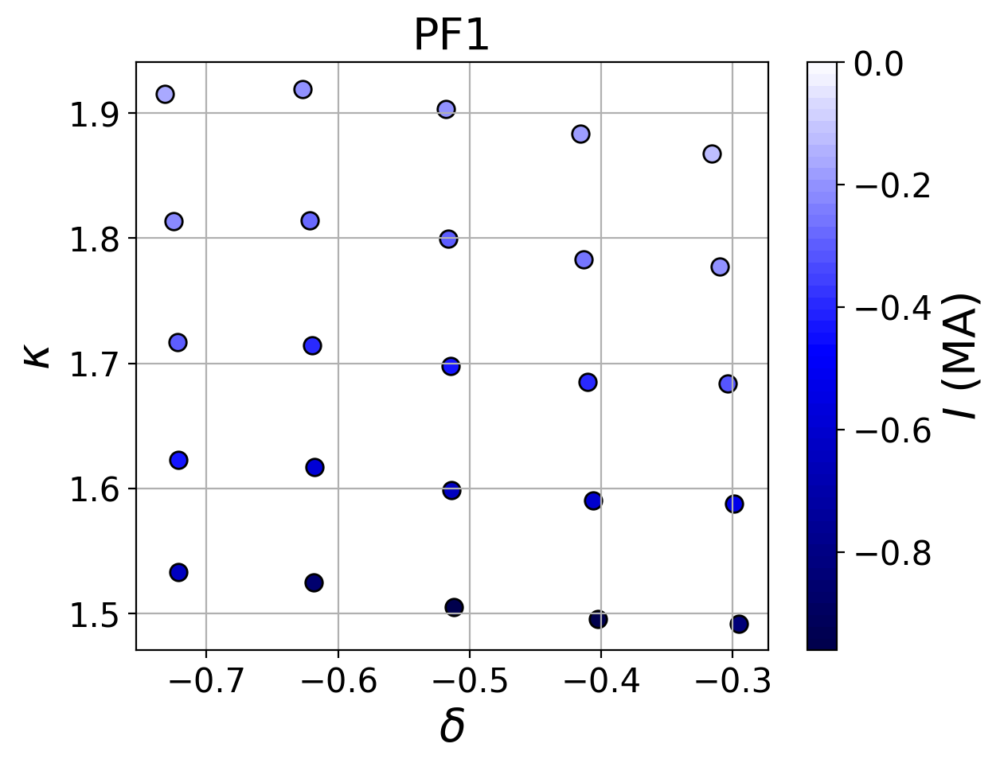

In [ ]:
import matplotlib as mpl
norm = plt.Normalize(-0.9610605, 0)
cmap = mpl.cm.seismic(np.linspace(0,1,100))
cmap = mpl.colors.ListedColormap(cmap[:50,:-1])
c = cmap(norm(coil_currents[:,3]/1E6))

print(coil_currents[:,3]/1E6)

for i in range(25):
    plt.scatter(deltas[i], kappas[i], color = c[i], edgecolors = 'k', s = 60)
plt.xlabel(r'$\delta$', size = 20)
plt.ylabel(r'$\kappa$', size = 20)
#plt.xlim([-0.7, -0.2])
#plt.ylim([1.4, 1.95])
plt.xticks(np.linspace(-0.7, -0.3, 5),size = 15)
plt.yticks(size = 15)
plt.grid()
plt.title(r'PF1', size = 20)
sm = plt.cm.ScalarMappable(cmap=cmap, norm = norm)
cb = plt.colorbar(sm)
cb.set_label(label=r'$I$ (MA)', size = 20)
cb.ax.tick_params(labelsize=15)

[-0.21605213 -0.2517582  -0.26177351 -0.25627331 -0.24517138  0.14334223
 -0.02012132 -0.1155084  -0.16816097 -0.19453237  0.48313366  0.19543426
  0.01978145 -0.08667883 -0.14885105  0.78109006  0.38752526  0.13961828
 -0.01525401 -0.11055544  1.02287442  0.54408201  0.23689485  0.04121114
 -0.08320238]


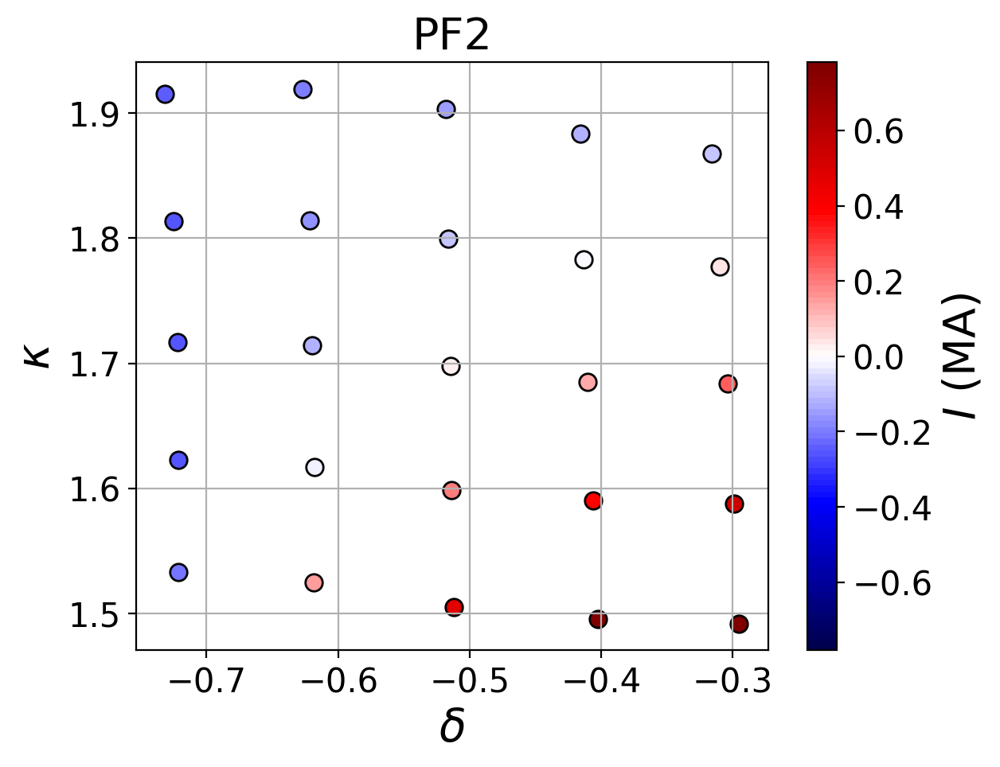

In [ ]:
import matplotlib as mpl
norm = plt.Normalize(-0.78109006, 0.78109006)
cmap = mpl.cm.seismic(np.linspace(0,1,100))
cmap = mpl.colors.ListedColormap(cmap[:,:-1])
c = cmap(norm(coil_currents[:,5]/1E6))

print(coil_currents[:,5]/1E6)

for i in range(25):
    plt.scatter(deltas[i], kappas[i], color = c[i], edgecolors = 'k', s = 60)
plt.xlabel(r'$\delta$', size = 20)
plt.ylabel(r'$\kappa$', size = 20)
#plt.xlim([-0.7, -0.2])
#plt.ylim([1.4, 1.95])
plt.xticks(np.linspace(-0.7, -0.3, 5),size = 15)
plt.yticks(size = 15)
plt.grid()
plt.title(r'PF2', size = 20)
sm = plt.cm.ScalarMappable(cmap=cmap, norm = norm)
cb = plt.colorbar(sm)
cb.set_label(label=r'$I$ (MA)', size = 20)
cb.ax.tick_params(labelsize=15)

[ 0.4287166   0.37666841  0.32889047  0.28434805  0.24916975  0.16091123
  0.2017314   0.21652722  0.21751976  0.21152754 -0.15893026 -0.01028697
  0.07655169  0.12755748  0.15716796 -0.50406797 -0.24711953 -0.08405206
  0.02022046  0.08860474 -0.84993407 -0.48933957 -0.25100558 -0.09280544
  0.01510566]


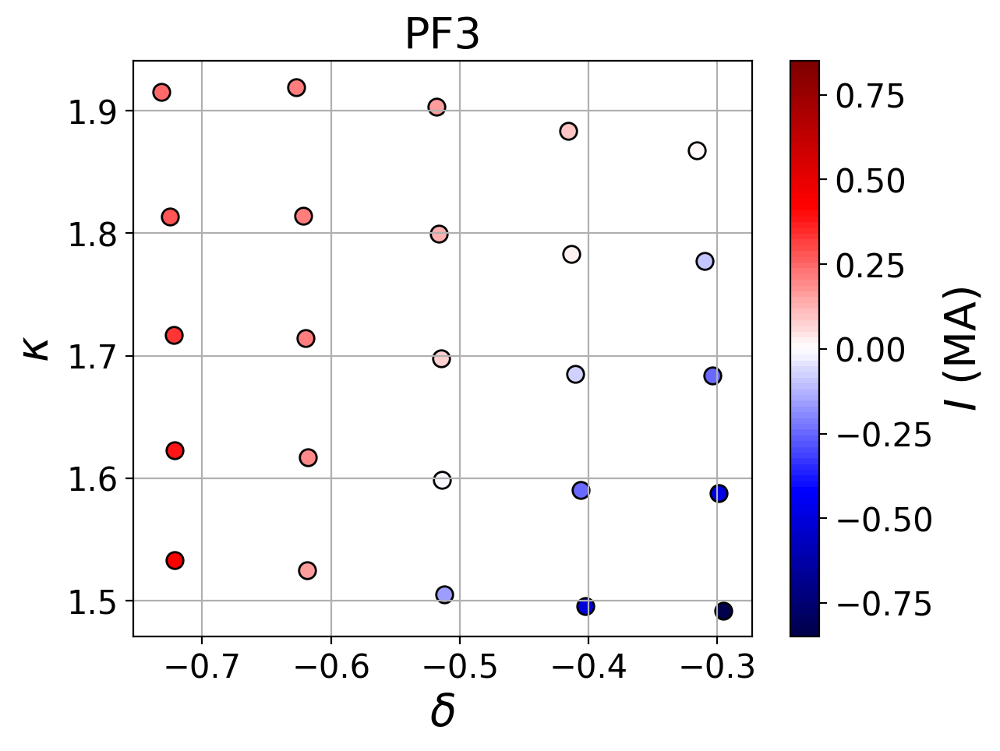

In [ ]:
import matplotlib as mpl
norm = plt.Normalize(-0.84993407, 0.84993407)
cmap = mpl.cm.seismic(np.linspace(0,1,100))
cmap = mpl.colors.ListedColormap(cmap[:,:-1])
c = cmap(norm(coil_currents[:,7]/1E6))

print(coil_currents[:,7]/1E6)

for i in range(25):
    plt.scatter(deltas[i], kappas[i], color = c[i], edgecolors = 'k', s = 60)
plt.xlabel(r'$\delta$', size = 20)
plt.ylabel(r'$\kappa$', size = 20)
#plt.xlim([-0.7, -0.2])
#plt.ylim([1.4, 1.95])
plt.xticks(np.linspace(-0.7, -0.3, 5),size = 15)
plt.yticks(size = 15)
plt.grid()
plt.title(r'PF3', size = 20)
sm = plt.cm.ScalarMappable(cmap=cmap, norm = norm)
cb = plt.colorbar(sm)
cb.set_label(label=r'$I$ (MA)', size = 20)
cb.ax.tick_params(labelsize=15)

[-0.87942108 -0.83139997 -0.79723745 -0.76688236 -0.7477723  -0.82351691
 -0.79381998 -0.77007323 -0.75302661 -0.73866016 -0.72065821 -0.72161738
 -0.7200715  -0.71827477 -0.71683106 -0.58602298 -0.62344682 -0.64812374
 -0.66594027 -0.67925582 -0.43045085 -0.50800712 -0.56382093 -0.60408029
 -0.63503529]


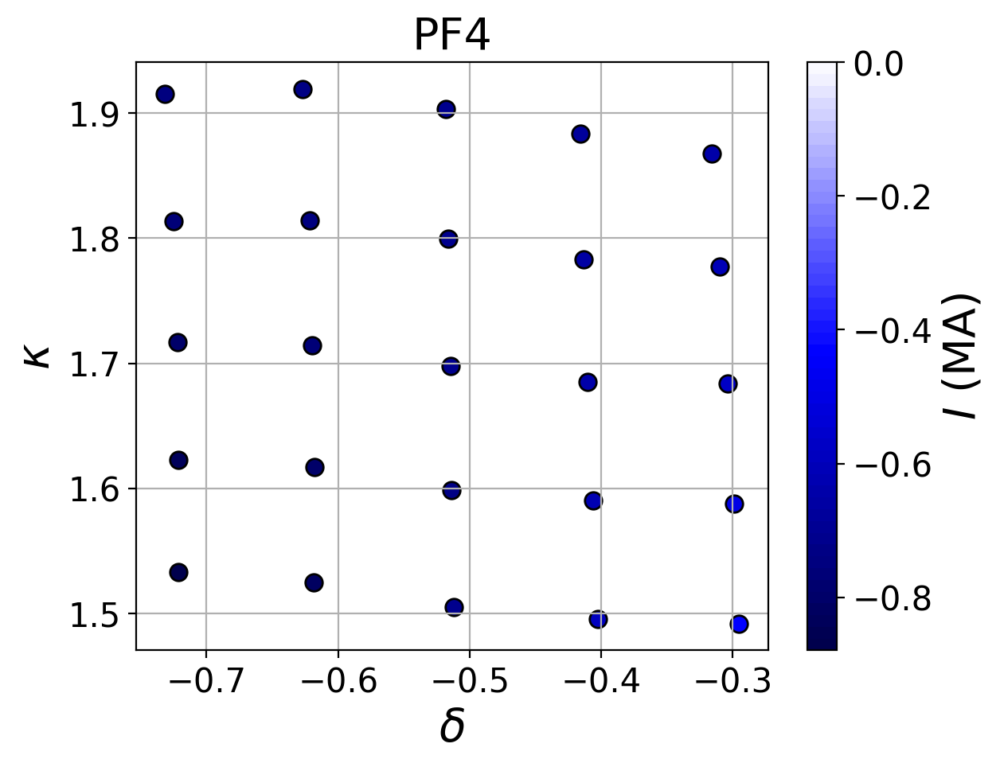

In [ ]:
import matplotlib as mpl
norm = plt.Normalize(-0.87942108, 0)
cmap = mpl.cm.seismic(np.linspace(0,1,100))
cmap = mpl.colors.ListedColormap(cmap[:50,:-1])
c = cmap(norm(coil_currents[:,9]/1E6))

print(coil_currents[:,9]/1E6)

for i in range(25):
    plt.scatter(deltas[i], kappas[i], color = c[i], edgecolors = 'k', s = 60)
plt.xlabel(r'$\delta$', size = 20)
plt.ylabel(r'$\kappa$', size = 20)
#plt.xlim([-0.7, -0.2])
#plt.ylim([1.4, 1.95])
plt.xticks(np.linspace(-0.7, -0.3, 5),size = 15)
plt.yticks(size = 15)
plt.grid()
plt.title(r'PF4', size = 20)
sm = plt.cm.ScalarMappable(cmap=cmap, norm = norm)
cb = plt.colorbar(sm)
cb.set_label(label=r'$I$ (MA)', size = 20)
cb.ax.tick_params(labelsize=15)

In [ ]:
print(q_95s)
q_95s = np.array(q_95s)

[1.9569329372607593, 2.166023688255489, 2.384030985136178, 2.617091591069589, 2.8580754200165464, 1.901050679030304, 2.095621905021293, 2.2982716076015386, 2.5084948944963577, 2.723566180901688, 1.878904089101911, 2.069854692738038, 2.265678446861679, 2.471346377316877, 2.6757395008227993, 1.8534977302078948, 2.043882399746703, 2.248866037215384, 2.461330353904835, 2.675085486486596, 1.8371800502656475, 2.027453498842786, 2.231930001631012, 2.451087695831952, 2.683980137882724]


In [ ]:
ip_new = 0.75*(q_95s/2)
print(ip_new)

[0.73384985 0.81225888 0.89401162 0.98140935 1.07177828 0.712894
 0.78585821 0.86185185 0.94068559 1.02133732 0.70458903 0.77619551
 0.84962942 0.92675489 1.00340231 0.69506165 0.7664559  0.84332476
 0.92299888 1.00315706 0.68894252 0.76029506 0.83697375 0.91915789
 1.00649255]


In [ ]:
max = []
which = []
coil_dim = np.array([0.125,0.125, 0.175,0.175,0.15,0.15, 0.175, 0.175])
for i in range(len(deltas)):
    pf_curr = np.array(currents[i][3:-4])/1E6
    dens = pf_curr/coil_dim**2
    max.append(np.max(np.abs(dens)))
    which.append(np.argmax(np.abs(np.abs(dens))))

ValueError: operands could not be broadcast together with shapes (6,) (8,) 

In [ ]:
print(np.array(max))
new_max = np.copy(max)
for i in range(len(max)):
    if ip_new[i]<0.75:
        new_max[i] = max[i]*ip_new[i]/0.75

print(new_max)
print(which)


[48.53147832 34.63933324 29.66484106 28.6249895  27.79823671 58.20227763
 40.81519437 28.88905101 27.07911691 26.8063388  61.09478258 41.79523878
 28.9440162  24.79496255 25.25832502 57.45285467 38.11324921 25.56691329
 21.83442747 23.15003781 49.14101427 30.97428788 19.47231629 18.5797045
 20.82447996]
[47.39793092 34.63933324 29.66484106 28.6249895  27.79823671 55.7789936
 40.81519437 28.88905101 27.07911691 26.8063388  57.91456548 41.79523878
 28.9440162  24.79496255 25.25832502 53.506066   38.11324921 25.56691329
 21.83442747 23.15003781 45.16847565 30.97428788 19.47231629 18.5797045
 20.82447996]
[1, 1, 6, 6, 6, 1, 1, 1, 6, 6, 1, 1, 1, 6, 6, 1, 1, 1, 6, 6, 0, 1, 1, 6, 6]


In [ ]:
import matplotlib as mpl
plt.rcParams['xtick.labelsize'] = 'large'
plt.rcParams['ytick.labelsize'] = 'large'
cmap = mpl.cm.plasma(np.linspace(0,1,100))
cmap = mpl.colors.ListedColormap(cmap[:,:-1])
from matplotlib.colors import LinearSegmentedColormap
colors = ["rebeccapurple","mediumpurple", "royalblue", "lightseagreen", "mediumaquamarine"]
colors = ["darkslateblue","mediumslateblue","hotpink","orange", "gold"]
nodes = [0.,0.22,  0.5, 0.78,1]
cmap1 = LinearSegmentedColormap.from_list("mycmap", list(zip(nodes, colors)))
norm = plt.Normalize(np.min(max_ip), np.max(max_ip))
c = cmap1(norm(max_ip))
for i in range(len(deltas)):
    plt.scatter(deltas[i],kappas[i], color = c[i], s = 45)

sm = plt.cm.ScalarMappable(cmap=cmap1, norm = norm)
cb = plt.colorbar(sm)
cb.set_label(label = r'$\mathrm{I}_{\mathrm{p}}$', size = 20)
plt.grid()
plt.xlabel(r'$\delta$', size = 20)
plt.ylabel(r'$\kappa$', size = 20)


NameError: name 'max_ip' is not defined

Text(0, 0.5, '$\\kappa$')

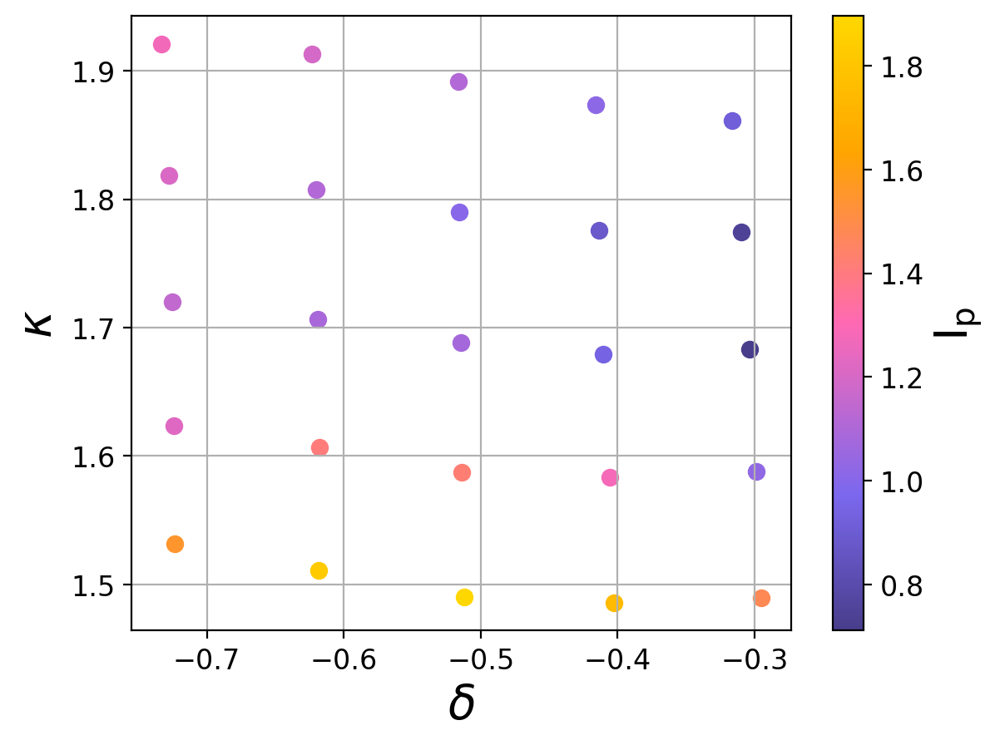

In [ ]:
import matplotlib as mpl
plt.rcParams['xtick.labelsize'] = 'large'
plt.rcParams['ytick.labelsize'] = 'large'
cmap = mpl.cm.plasma(np.linspace(0,1,100))
cmap = mpl.colors.ListedColormap(cmap[:,:-1])
from matplotlib.colors import LinearSegmentedColormap
colors = ["rebeccapurple","mediumpurple", "royalblue", "lightseagreen", "mediumaquamarine"]
colors = ["darkslateblue","mediumslateblue","hotpink","orange", "gold"]
nodes = [0.,0.22,  0.5, 0.78,1]
cmap1 = LinearSegmentedColormap.from_list("mycmap", list(zip(nodes, colors)))
norm = plt.Normalize(np.min(q_at_max), np.max(q_at_max))
c = cmap1(norm(q_at_max))
for i in range(len(deltas)):
    plt.scatter(deltas[i],kappas[i], color = c[i], s = 45)

sm = plt.cm.ScalarMappable(cmap=cmap1, norm = norm)
cb = plt.colorbar(sm)
cb.set_label(label = r'$\mathrm{I}_{\mathrm{p}}$', size = 20)
plt.grid()
plt.xlabel(r'$\delta$', size = 20)
plt.ylabel(r'$\kappa$', size = 20)
